In [1]:
import os
from pathlib import Path

import dotenv
import pytorch_lightning as pl
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import RichProgressBar
from pytorch_lightning.loggers import WandbLogger

import wandb
from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3
from inz.models.bdanet_simplified import BDANetSimplified
from inz.models.util import get_loc_cls_weights, show_masks_comparison

In [2]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [3]:
# seriously?
import ssl

ssl._create_default_https_context = ssl._create_unverified_context

### Tensor sizes sanity check

In [4]:
model = BDANetSimplified(n_classes=6, loss=nn.CrossEntropyLoss()).to(device)

x_pre = torch.rand([16, 3, 256, 256]).to(device)
x_post = torch.rand([16, 3, 256, 256]).to(device)

with torch.no_grad():
    out = model(x_pre, x_post)
    assert out.shape == (16, 6, 256, 256), f"Shape is {out.size}"

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


In [5]:
dm = XBDDataModule(
    path=Path("data/xBD_processed"),
    events={
        # Tier1: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        Tier3: [
            Event.joplin_tornado,
            #     # Event.moore_tornado,
            #     # Event.tuscaloosa_tornado
        ],
        # Hold: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        # Test: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
    },
    val_faction=0.15,
    test_fraction=0.0,
    train_batch_size=24,
    val_batch_size=24,
    test_batch_size=24,
    # split_events={
    #     "train": {
    #         Tier1: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             # Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #         Tier3: [
    #             Event.joplin_tornado,
    #             Event.moore_tornado,
    #             Event.tuscaloosa_tornado
    #         ],
    #     },
    #     "val": {
    #         Hold: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #         Test: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #     },
    # },
)
dm.prepare_data()
dm.setup("fit")

print(f"{len(dm.train_dataloader())} train batches, {len(dm.val_dataloader())} val batches")

85 train batches, 15 val batches


In [6]:
loc_weights, cls_weights = get_loc_cls_weights(dataloader=dm.train_dataloader(), device=device)

print(f"Localization weights: {loc_weights}\nClassification weights: {cls_weights}")

100%|██████████| 85/85 [00:20<00:00,  4.23it/s]


Localization weights: tensor([0.1039, 0.8961], device='cuda:0')
Classification weights: tensor([0.0015, 0.0235, 0.0874, 0.1362, 0.0746, 0.0000], device='cuda:0')


In [7]:
assert (WANDB_API_KEY := os.getenv("WANDB_API_KEY"))

wandb.login(key=WANDB_API_KEY, verify=True)

wandb_logger = WandbLogger(project="test")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: snurtel (snurtel-n-a). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/tomek/.netrc


In [8]:
trainer = pl.Trainer(
    max_epochs=20,
    callbacks=[
        RichProgressBar(),
    ],
    precision="bf16",
    logger=wandb_logger,
)
trainer.fit(model, datamodule=dm)

/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/lightning_fabric/connector.py:563: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃    ┃ Name                ┃ Type                ┃ Params ┃
┡━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0  │ loss_fn             │ CrossEntropyLoss    │      0 │
│ 1  │ down_conv1          │ Sequential          │  9.5 K │
│ 2  │ down_conv2          │ Sequential          │  231 K │
│ 3  │ down_conv3          │ Sequential          │  1.3 M │
│ 4  │ down_conv4          │ Sequential          │  7.8 M │
│ 5  │ down_conv5          │ Sequential          │ 16.1 M │
│ 6  │ up_conv54           │ UpConv              │  7.7 M │
│ 7  │ up_conv43           │ UpConv              │  1.0 M │
│ 8  │ up_conv32           │ UpConv              │  258 K │
│ 9  │ up_conv21           │ UpConv              │ 76.1 K │
│ 10 │ up_conv1_nores      │ ConvReLU            │ 13.9 K │
│ 11 │ outconv             │ Conv2d              │    390 │
│ 12 │ accuracy_loc        │ BinaryAccuracy      │      0 │
│ 13 │ iou_loc             │ MeanIoU             │      0 │
│ 14 │ f1                  │ MulticlassF1Score   │      0 │
│ 15 │ precision           │ MulticlassPrecision │      0 │
│ 16 │ recall              │ MulticlassRecall    │      0 │
│ 17 │ iou                 │ MeanIoU             │      0 │
│ 18 │ f1_per_class        │ MulticlassF1Score   │      0 │
│ 19 │ precision_per_class │ MulticlassPrecision │      0 │
│ 20 │ recall_per_class    │ MulticlassRecall    │      0 │
│ 21 │ iou_per_class       │ MeanIoU             │      0 │
└────┴─────────────────────┴─────────────────────┴────────┘

Trainable params: 34.6 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 34.6 M                                                                                               
Total estimated model params size (MB): 138

Output()

`Trainer.fit` stopped: `max_epochs=20` reached.


In [9]:
model.eval()

BDANetSimplified(
  (loss_fn): CrossEntropyLoss()
  (down_conv1): Sequential(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
  )
  (down_conv2): Sequential(
    (0): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (1): Sequential(
      (0): SEResNeXtBottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_runn

In [10]:
it = iter(dm.val_dataloader())
batch = next(it)
images_pre, masks_pre, images_post, masks_post = batch
with torch.no_grad():
    preds = model(images_pre.to(device), images_post.to(device))

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

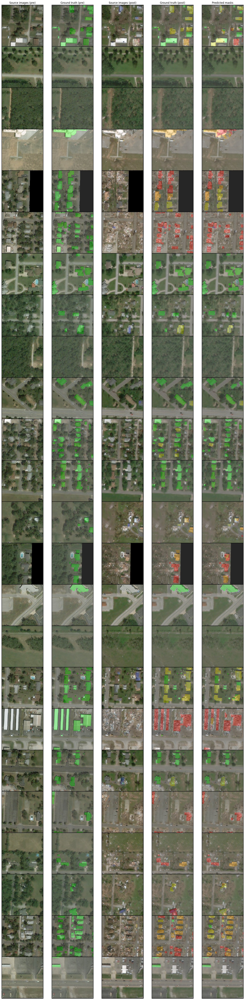

In [ ]:
plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["figure.figsize"] = [20, 120]

show_masks_comparison(
    images_pre=images_pre, images_post=images_post, masks_pre=masks_pre, masks_post=masks_post, preds=preds, opacity=0.3
)